<a href="https://colab.research.google.com/github/555Chaithanya/NLP_ChatBot/blob/main/ChatBot1_2.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
#!pip install nlp_utils

In [ ]:
import nltk
import string
import pandas as pd
#import nlp_utils as nu
import matplotlib.pyplot as plt

In [ ]:
from google.colab import drive
drive.mount("/content/drive")

Mounted at /content/drive


In [ ]:
# f=open("dialogs.txt","r")
# print(f.read())
pd.set_option("display.max_columns",None)
f=open("/content/drive/MyDrive/Internship/dialogs.txt")
print(f.read())

hi, how are you doing?	i'm fine. how about yourself?
i'm fine. how about yourself?	i'm pretty good. thanks for asking.
i'm pretty good. thanks for asking.	no problem. so how have you been?
no problem. so how have you been?	i've been great. what about you?
i've been great. what about you?	i've been good. i'm in school right now.
i've been good. i'm in school right now.	what school do you go to?
what school do you go to?	i go to pcc.
i go to pcc.	do you like it there?
do you like it there?	it's okay. it's a really big campus.
it's okay. it's a really big campus.	good luck with school.
good luck with school.	thank you very much.
how's it going?	i'm doing well. how about you?
i'm doing well. how about you?	never better, thanks.
never better, thanks.	so how have you been lately?
so how have you been lately?	i've actually been pretty good. you?
i've actually been pretty good. you?	i'm actually in school right now.
i'm actually in school right now.	which school do you attend?
which school do 

In [ ]:
df=pd.read_csv("/content/drive/MyDrive/Internship/dialogs.txt",names=('Query','Response'),sep=('\t'))

In [ ]:
df

,Query,Response
0,"hi, how are you doing?",i'm fine. how about yourself?
1,i'm fine. how about yourself?,i'm pretty good. thanks for asking.
2,i'm pretty good. thanks for asking.,no problem. so how have you been?
3,no problem. so how have you been?,i've been great. what about you?
4,i've been great. what about you?,i've been good. i'm in school right now.
...,...,...
3720,that's a good question. maybe it's not old age.,are you right-handed?
3721,are you right-handed?,yes. all my life.
3722,yes. all my life.,you're wearing out your right hand. stop using...
3723,you're wearing out your right hand. stop using...,but i do all my writing with my right hand.


In [ ]:
df.shape

(3725, 2)

In [ ]:
df.columns

Index(['Query', 'Response'], dtype='object')

In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3725 entries, 0 to 3724
Data columns (total 2 columns):
 #   Column    Non-Null Count  Dtype 
---  ------    --------------  ----- 
 0   Query     3725 non-null   object
 1   Response  3725 non-null   object
dtypes: object(2)
memory usage: 58.3+ KB


In [ ]:
df.describe()

,Query,Response
count,3725,3725
unique,3510,3512
top,what do you mean?,what do you mean?
freq,22,22


In [ ]:
df.nunique()

Query       3510
Response    3512
dtype: int64

In [ ]:
df.isnull().sum()

Query       0
Response    0
dtype: int64

In [ ]:
df['Query'].value_counts()

what do you mean?                              22
why not?                                       16
what happened?                                 10
why is that?                                    9
me too.                                         7
                                               ..
you can yell at them.                           1
and they will yell back at you.                 1
yelling doesn't do any good.                    1
will you look at this form?                     1
but i do all my writing with my right hand.     1
Name: Query, Length: 3510, dtype: int64

In [ ]:
df['Response'].value_counts()

what do you mean?                                                       22
why not?                                                                16
what happened?                                                          10
why is that?                                                             9
of course.                                                               8
                                                                        ..
i don't understand some things.                                          1
let me help you.                                                         1
what does "mi" mean?                                                     1
mi stands for middle initial.                                            1
start typing instead. that way your left hand will do half the work.     1
Name: Response, Length: 3512, dtype: int64

In [ ]:
pip install -U nltk

In [ ]:
pip install vaderSentiment

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 126.0/126.0 kB 1.5 MB/s eta 0:00:00


In [ ]:
from vaderSentiment.vaderSentiment import SentimentIntensityAnalyzer

In [ ]:
text=df['Query']
text

0                                  hi, how are you doing?
1                           i'm fine. how about yourself?
2                     i'm pretty good. thanks for asking.
3                       no problem. so how have you been?
4                        i've been great. what about you?
                              ...                        
3720      that's a good question. maybe it's not old age.
3721                                are you right-handed?
3722                                    yes. all my life.
3723    you're wearing out your right hand. stop using...
3724          but i do all my writing with my right hand.
Name: Query, Length: 3725, dtype: object

In [ ]:
sia =SentimentIntensityAnalyzer()
for sentence in text:
    print(sentence)
    polarity_sentence= sia.polarity_scores(sentence)
    for k in polarity_sentence:
        print('\t{0}:{1}\n '.format(k,polarity_sentence[k]),end=' ')
    print()

Streaming output truncated to the last 5000 lines.
  	compound:0.0
  
so did i.
	neg:0.0
  	neu:1.0
  	pos:0.0
  	compound:0.0
  
i didn't even have lunch.
	neg:0.0
  	neu:1.0
  	pos:0.0
  	compound:0.0
  
neither did i.
	neg:0.0
  	neu:1.0
  	pos:0.0
  	compound:0.0
  
i was busy the whole day.
	neg:0.0
  	neu:1.0
  	pos:0.0
  	compound:0.0
  
so was i.
	neg:0.0
  	neu:1.0
  	pos:0.0
  	compound:0.0
  
i had to bring work home with me.
	neg:0.0
  	neu:1.0
  	pos:0.0
  	compound:0.0
  
i did too.
	neg:0.0
  	neu:1.0
  	pos:0.0
  	compound:0.0
  
your day was just like mine.
	neg:0.0
  	neu:0.667
  	pos:0.333
  	compound:0.3612
  
i don't like my job.
	neg:0.345
  	neu:0.655
  	pos:0.0
  	compound:-0.2755
  
what do you do?
	neg:0.0
  	neu:1.0
  	pos:0.0
  	compound:0.0
  
i'm a babysitter.
	neg:0.0
  	neu:1.0
  	pos:0.0
  	compound:0.0
  
is that a lot of work?
	neg:0.0
  	neu:1.0
  	pos:0.0
  	compound:0.0
  
babies cry all the time.
	neg:0.437
  	neu:0.563
  	pos:0.0
  	compound:-0.4

In [ ]:
analyzer=SentimentIntensityAnalyzer()
df['rating']=text.apply(analyzer.polarity_scores)
df

,Query,Response,rating
0,"hi, how are you doing?",i'm fine. how about yourself?,"{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound..."
1,i'm fine. how about yourself?,i'm pretty good. thanks for asking.,"{'neg': 0.0, 'neu': 0.69, 'pos': 0.31, 'compou..."
2,i'm pretty good. thanks for asking.,no problem. so how have you been?,"{'neg': 0.0, 'neu': 0.25, 'pos': 0.75, 'compou..."
3,no problem. so how have you been?,i've been great. what about you?,"{'neg': 0.0, 'neu': 0.727, 'pos': 0.273, 'comp..."
4,i've been great. what about you?,i've been good. i'm in school right now.,"{'neg': 0.0, 'neu': 0.549, 'pos': 0.451, 'comp..."
...,...,...,...
3720,that's a good question. maybe it's not old age.,are you right-handed?,"{'neg': 0.0, 'neu': 0.734, 'pos': 0.266, 'comp..."
3721,are you right-handed?,yes. all my life.,"{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound..."
3722,yes. all my life.,you're wearing out your right hand. stop using...,"{'neg': 0.0, 'neu': 0.526, 'pos': 0.474, 'comp..."
3723,you're wearing out your right hand. stop using...,but i do all my writing with my right hand.,"{'neg': 0.153, 'neu': 0.625, 'pos': 0.222, 'co..."


In [ ]:
df=pd.concat([df.drop(['rating'],axis=1),df['rating'].apply(pd.Series)],axis=1)
df

,Query,Response,neg,neu,pos,compound
0,"hi, how are you doing?",i'm fine. how about yourself?,0.000,1.000,0.000,0.0000
1,i'm fine. how about yourself?,i'm pretty good. thanks for asking.,0.000,0.690,0.310,0.2023
2,i'm pretty good. thanks for asking.,no problem. so how have you been?,0.000,0.250,0.750,0.8402
3,no problem. so how have you been?,i've been great. what about you?,0.000,0.727,0.273,0.3089
4,i've been great. what about you?,i've been good. i'm in school right now.,0.000,0.549,0.451,0.6249
...,...,...,...,...,...,...
3720,that's a good question. maybe it's not old age.,are you right-handed?,0.000,0.734,0.266,0.4404
3721,are you right-handed?,yes. all my life.,0.000,1.000,0.000,0.0000
3722,yes. all my life.,you're wearing out your right hand. stop using...,0.000,0.526,0.474,0.4019
3723,you're wearing out your right hand. stop using...,but i do all my writing with my right hand.,0.153,0.625,0.222,0.2500


In [ ]:
from wordcloud import WordCloud as wcloud

In [ ]:
def CloudingWords(df,label,colr,n):
    subset=df[df[label]==1]
    wc=wcloud(background_color=colr,max_words=1000)
    wc.generate(" ".join(text))

    plt.figure(figsize=(25,25))
    plt.subplot(221)
    plt.axis('off')
    plt.title('Freequently used words in {}'.format(label),fontsize=20)
    plt.imshow(wc.recolor(colormap='autumn',random_state=n),alpha=0.99)


In [ ]:
# Testing1
r=df[df['Query']==1]
r

,Query,Response,neg,neu,pos,compound


In [ ]:
#Testing2
text2=df.Query.values
text2

array(['hi, how are you doing?', "i'm fine. how about yourself?",
       "i'm pretty good. thanks for asking.", ..., 'yes. all my life.',
       "you're wearing out your right hand. stop using it so much.",
       'but i do all my writing with my right hand.'], dtype=object)

Text(0.5, 1.0, 'Freequently used words in Query')

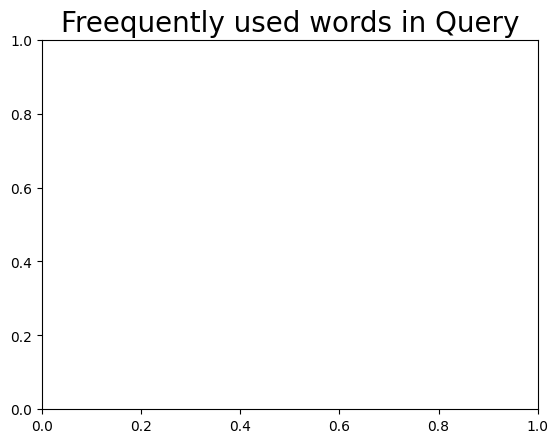

In [ ]:
 #testing3
plt.subplot(111)
plt.title('Freequently used words in {}'.format('Query'),fontsize=20)

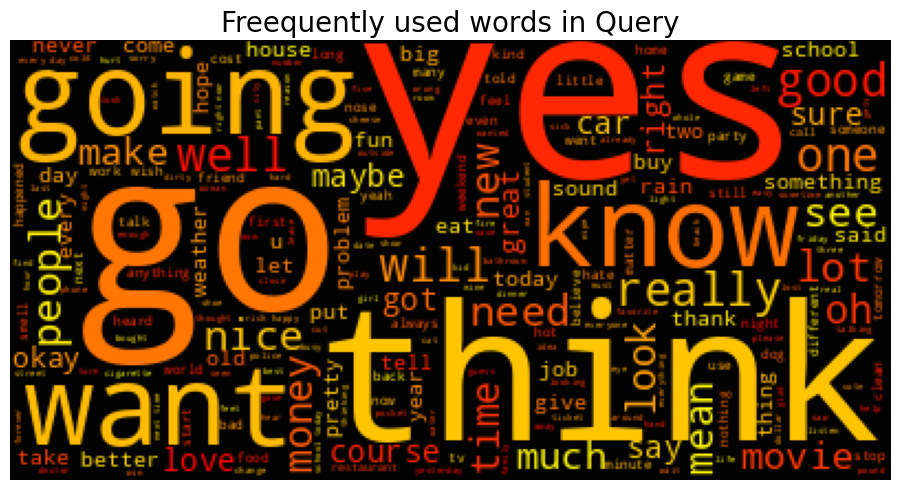

In [ ]:
CloudingWords(df,'Query','black',100)

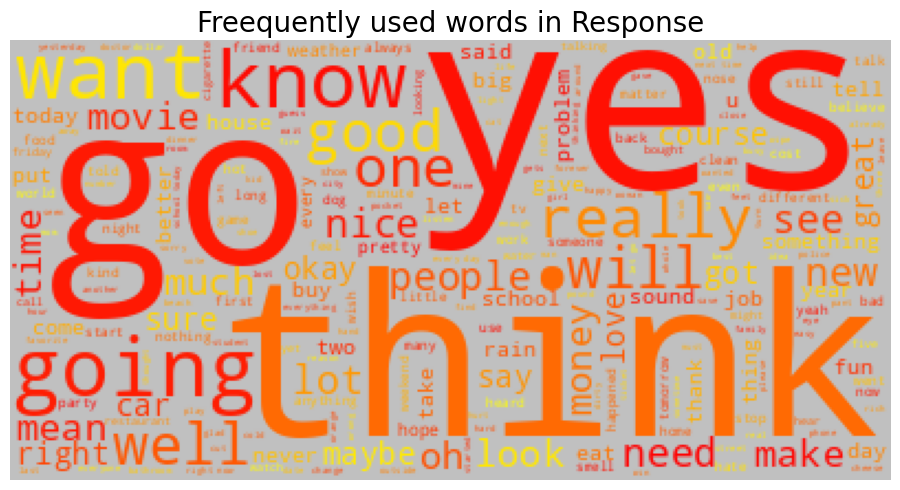

In [ ]:
CloudingWords(df,'Response','silver',123)

TEXT NORMALISATION

In [ ]:
import re #Regular Expressions

In [ ]:
punc_lower=lambda x: re.sub('[%s]'%re.escape(string.punctuation),'',x.lower())
punc_lower

<function __main__.<lambda>(x)>

In [ ]:
#Testing4: Removing Punctuations
str = 'Trafalgar-D-Water-Law@google.com, \n (Monkey-D-Luffy@abc.com) JoyBoy'
results = re.sub('[%s]'%re.escape(string.punctuation),"", str.lower())
results

'trafalgardwaterlawgooglecom \n monkeydluffyabccom joyboy'

In [ ]:
remove_n=lambda x: re.sub('\n',"",x)
remove_n

<function __main__.<lambda>(x)>

In [ ]:
#Testing5: Removing "\n"
str = 'Trafalgar-D-Water-Law@google.com,\n Monkey-D-Luffy@abc.com JoyBoy'
results1 = re.sub('\n',"",str)
results1

'Trafalgar-D-Water-Law@google.com, Monkey-D-Luffy@abc.com JoyBoy'

In [ ]:
remove_non_ascii=lambda x: re.sub(r'[^\x00-\x7f]',r'',x)

In [ ]:
#Testing6: Removing NON-ASCII characters
str = 'Trafalgar-D-Water-Law@google.com,\n 1±(2×3)÷6,\n Monkey-D-Luffy@abc.com JoyBoy'
results2 = re.sub('[^\x00-\x7f]','',str)
results2

'Trafalgar-D-Water-Law@google.com,\n 1(23)6,\n Monkey-D-Luffy@abc.com JoyBoy'

In [ ]:
alphanumeric=lambda x: re.sub("\w*\d\w*","",x)

In [ ]:
#Testing6: Removing Numeric values
str = 'Trafalgar-D-Water-Law@google.com,\n 1±(2×3)÷6,\n Monkey-D-Luffy@abc.com JoyBoy'
results3 = re.sub("\w*\d\w*","",str)
results3

'Trafalgar-D-Water-Law@google.com,\n ±(×)÷,\n Monkey-D-Luffy@abc.com JoyBoy'

In [ ]:
df['Response']=df['Response'].map(alphanumeric).map(remove_n).map(remove_non_ascii).map(punc_lower)

In [ ]:
df['Query']=df['Query'].map(alphanumeric).map(remove_n).map(remove_non_ascii).map(punc_lower)

In [ ]:
#Testing_final:Apply all created functions on str
str = 'Trafalgar-D-Water-Law@google.com,\n 1±(2×3)÷6,\n Monkey-D-Luffy@abc.com JoyBoy'
results4 = punc_lower(alphanumeric(remove_n(remove_non_ascii((str)))))
results4

'trafalgardwaterlawgooglecom  monkeydluffyabccom joyboy'

In [ ]:
# final cleaned dataset
#df=df.drop('Response]',axis=1)

In [ ]:
df

,Query,Response,neg,neu,pos,compound
0,hi how are you doing,im fine how about yourself,0.000,1.000,0.000,0.0000
1,im fine how about yourself,im pretty good thanks for asking,0.000,0.690,0.310,0.2023
2,im pretty good thanks for asking,no problem so how have you been,0.000,0.250,0.750,0.8402
3,no problem so how have you been,ive been great what about you,0.000,0.727,0.273,0.3089
4,ive been great what about you,ive been good im in school right now,0.000,0.549,0.451,0.6249
...,...,...,...,...,...,...
3720,thats a good question maybe its not old age,are you righthanded,0.000,0.734,0.266,0.4404
3721,are you righthanded,yes all my life,0.000,1.000,0.000,0.0000
3722,yes all my life,youre wearing out your right hand stop using i...,0.000,0.526,0.474,0.4019
3723,youre wearing out your right hand stop using i...,but i do all my writing with my right hand,0.153,0.625,0.222,0.2500


In [ ]:
pd.set_option('display.max_rows',3800)

In [ ]:
df

,Query,Response,neg,neu,pos,compound
0,hi how are you doing,im fine how about yourself,0.000,1.000,0.000,0.0000
1,im fine how about yourself,im pretty good thanks for asking,0.000,0.690,0.310,0.2023
2,im pretty good thanks for asking,no problem so how have you been,0.000,0.250,0.750,0.8402
3,no problem so how have you been,ive been great what about you,0.000,0.727,0.273,0.3089
4,ive been great what about you,ive been good im in school right now,0.000,0.549,0.451,0.6249
5,ive been good im in school right now,what school do you go to,0.000,0.707,0.293,0.4404
6,what school do you go to,i go to pcc,0.000,1.000,0.000,0.0000
7,i go to pcc,do you like it there,0.000,1.000,0.000,0.0000
8,do you like it there,its okay its a really big campus,0.000,0.615,0.385,0.3612
9,its okay its a really big campus,good luck with school,0.000,0.759,0.241,0.2263


In [ ]:
#Sorting Query based on neg,pos,neu,compound

In [ ]:
comp_sent=df.sort_values(by="compound",ascending=False)
comp_sent

,Query,Response,neg,neu,pos,compound
1019,if we are good we will be happy in heaven with...,thats what many people believe,0.000,0.400,0.600,0.9001
565,yeah it sounds like its going to be the best p...,exactly it seems like its going to be loads of...,0.000,0.463,0.537,0.8910
1235,that is a lot of friends do you have a best fr...,of course i have lots of best friends,0.000,0.462,0.538,0.8885
3414,well thats okay as long as it helps him relax ...,yes we need a relaxed president who thinks cle...,0.000,0.419,0.581,0.8883
3625,his doctor says his heart and lungs are strong...,maybe i should start smoking,0.000,0.440,0.560,0.8807
3470,so its better to save money than to have an ho...,well the democratic party says it was an hones...,0.000,0.482,0.518,0.8651
2096,she loves you yeah yeah yeah,and you know you should be glad,0.000,0.159,0.841,0.8622
3456,but even if my candidate wins hell break his p...,thats true they promise anything just so they ...,0.000,0.486,0.514,0.8573
1492,if youre going to make a wish wish that you we...,dont you ever wonder what its like to be super...,0.000,0.564,0.436,0.8516
310,well its good that youre so talented,i appreciate that,0.000,0.302,0.698,0.8497


In [ ]:
#top negative sentences
neg_sent=df.sort_values(by="neg",ascending=False)
neg_sent

,Query,Response,neg,neu,pos,compound
13,never better thanks,so how have you been lately,0.828,0.172,0.000,-0.5875
2382,thats disgusting,and he poured water into our glasses,0.773,0.227,0.000,-0.5267
2294,thats dangerous,i thought about getting out and taking a taxi ...,0.756,0.244,0.000,-0.4767
3099,whats wrong,its not orange,0.756,0.244,0.000,-0.4767
1692,how rude,but i got lucky a few minutes later,0.750,0.250,0.000,-0.4588
2292,thats rude,then he drove too fast to the restaurant,0.750,0.250,0.000,-0.4588
675,thats harsh,im sorry but i have to go,0.744,0.256,0.000,-0.4404
3649,pimples suck,it seems like i get a new pimple almost every day,0.744,0.256,0.000,-0.4404
1547,thats ridiculous,you dont like pretty women,0.736,0.264,0.000,-0.4199
1474,poetry sucks,i dont know anyone who likes it,0.714,0.286,0.000,-0.3612


In [ ]:
#top positive sentences
pos_sent=df.sort_values(by="pos",ascending=False)
pos_sent

,Query,Response,neg,neu,pos,compound
980,yes,are you reading this paper,0.000,0.000,1.000,0.4019
300,thanks,if only i was talented,0.000,0.000,1.000,0.4404
1659,please,you know the rules,0.000,0.000,1.000,0.3182
1191,yes,no thats incomplete,0.000,0.000,1.000,0.4019
2434,yes,is it beautiful,0.000,0.000,1.000,0.4019
2730,yes,see those stains,0.000,0.000,1.000,0.4019
223,well congratulations,thank you,0.000,0.000,1.000,0.7184
3583,sure,thank you,0.000,0.000,1.000,0.3182
245,thats great congratulations,i appreciate that,0.000,0.111,0.889,0.8402
471,wow how exciting,i know you should really go and see her and th...,0.000,0.125,0.875,0.7906


In [ ]:
#top neutral sentences
neu_sent=df.sort_values(by="neu",ascending=False)
neu_sent

,Query,Response,neg,neu,pos,compound
0,hi how are you doing,im fine how about yourself,0.000,1.000,0.000,0.0000
1625,how about a dictionary,no we have a big dictionary in the classroom,0.000,1.000,0.000,0.0000
1619,anything else,i need a notebook,0.000,1.000,0.000,0.0000
1620,i need a notebook,do you need a pen,0.000,1.000,0.000,0.0000
1621,do you need a pen,no i already have a pen,0.000,1.000,0.000,0.0000
1622,no i already have a pen,do you need a calculator,0.000,1.000,0.000,0.0000
1623,do you need a calculator,no the teacher doesnt permit calculators,0.000,1.000,0.000,0.0000
1624,no the teacher doesnt permit calculators,how about a dictionary,0.000,1.000,0.000,0.0000
1626,no we have a big dictionary in the classroom,well i guess thats it,0.000,1.000,0.000,0.0000
1617,what do you need for school,i need pencils,0.000,1.000,0.000,0.0000


In [ ]:
#CountVectorizer

In [ ]:
from sklearn.feature_extraction.text import CountVectorizer

In [ ]:
# Query_data=df['Query']
# vec=CountVectorizer()
# X=vec.fit_transform(Query_data)
# resq1=pd.DataFrame(X.toarray(),columns=vec.get_feature_names())
# resq1

In [ ]:
# resq1.sum().sort_values(ascending=False)

In [ ]:
# res_data=df['Response']
# vec1=CountVectorizer()
# X2=vec.fit_transform(res_data)
# resr1=pd.DataFrame(X2.toarray(),columns=vec.get_feature_names())
# resr1

In [ ]:
# resr1.sum().sort_values(ascending=False)

In [ ]:
#TfidfVectorizer

In [ ]:
from sklearn.feature_extraction.text import TfidfVectorizer

In [ ]:
tfidf=TfidfVectorizer()

In [ ]:
factors= tfidf.fit_transform(df['Query'])
print(factors.toarray())

[[0.         0.         0.         ... 0.         0.         0.        ]
 [0.         0.33121572 0.         ... 0.         0.         0.        ]
 [0.         0.         0.         ... 0.         0.         0.        ]
 ...
 [0.         0.         0.         ... 0.         0.         0.        ]
 [0.         0.         0.         ... 0.         0.         0.        ]
 [0.         0.         0.         ... 0.         0.         0.        ]]


In [ ]:
tfidf.get_feature_names_out()

array(['able', 'about', 'absolutely', ..., 'yuck', 'zip', 'zoo'],
      dtype=object)

In [ ]:
import nltk
nltk.download()

NLTK Downloader
---------------------------------------------------------------------------
    d) Download   l) List    u) Update   c) Config   h) Help   q) Quit
---------------------------------------------------------------------------
Downloader> d

Download which package (l=list; x=cancel)?
  Identifier> all


       | 
       | Downloading package abc to /root/nltk_data...
       |   Unzipping corpora/abc.zip.
       | Downloading package alpino to /root/nltk_data...
       |   Unzipping corpora/alpino.zip.
       | Downloading package averaged_perceptron_tagger to
       |     /root/nltk_data...
       |   Unzipping taggers/averaged_perceptron_tagger.zip.
       | Downloading package averaged_perceptron_tagger_ru to
       |     /root/nltk_data...
       |   Unzipping taggers/averaged_perceptron_tagger_ru.zip.
       | Downloading package basque_grammars to /root/nltk_data...
       |   Unzipping grammars/basque_grammars.zip.
       | Downloading package bcp47 to /root/nltk_data...
       | Downloading package biocreative_ppi to /root/nltk_data...
       |   Unzipping corpora/biocreative_ppi.zip.
       | Downloading package bllip_wsj_no_aux to /root/nltk_data...
       |   Unzipping models/bllip_wsj_no_aux.zip.
       | Downloading package book_grammars to /root/nltk_data...
       |   Un


---------------------------------------------------------------------------
    d) Download   l) List    u) Update   c) Config   h) Help   q) Quit
---------------------------------------------------------------------------
Downloader> q


True

In [ ]:
import nltk
from nltk import pos_tag
from nltk.stem import WordNetLemmatizer
from nltk.stem import PorterStemmer, LancasterStemmer, SnowballStemmer
from nltk.corpus import stopwords
import string
import re

CONTRACTION_MAP = {
"ain't": "is not",
"aren't": "are not",
"can't": "cannot",
"can't've": "cannot have",
"'cause": "because",
"could've": "could have",
"couldn't": "could not",
"couldn't've": "could not have",
"didn't": "did not",
"doesn't": "does not",
"don't": "do not",
"hadn't": "had not",
"hadn't've": "had not have",
"hasn't": "has not",
"haven't": "have not",
"he'd": "he would",
"he'd've": "he would have",
"he'll": "he will",
"he'll've": "he he will have",
"he's": "he is",
"how'd": "how did",
"how'd'y": "how do you",
"how'll": "how will",
"how's": "how is",
"I'd": "I would",
"I'd've": "I would have",
"I'll": "I will",
"I'll've": "I will have",
"I'm": "I am",
"I've": "I have",
"i'd": "i would",
"i'd've": "i would have",
"i'll": "i will",
"i'll've": "i will have",
"i'm": "i am",
"i've": "i have",
"isn't": "is not",
"it'd": "it would",
"it'd've": "it would have",
"it'll": "it will",
"it'll've": "it will have",
"it's": "it is",
"let's": "let us",
"ma'am": "madam",
"mayn't": "may not",
"might've": "might have",
"mightn't": "might not",
"mightn't've": "might not have",
"must've": "must have",
"mustn't": "must not",
"mustn't've": "must not have",
"needn't": "need not",
"needn't've": "need not have",
"o'clock": "of the clock",
"oughtn't": "ought not",
"oughtn't've": "ought not have",
"shan't": "shall not",
"sha'n't": "shall not",
"shan't've": "shall not have",
"she'd": "she would",
"she'd've": "she would have",
"she'll": "she will",
"she'll've": "she will have",
"she's": "she is",
"should've": "should have",
"shouldn't": "should not",
"shouldn't've": "should not have",
"so've": "so have",
"so's": "so as",
"that'd": "that would",
"that'd've": "that would have",
"that's": "that is",
"there'd": "there would",
"there'd've": "there would have",
"there's": "there is",
"they'd": "they would",
"they'd've": "they would have",
"they'll": "they will",
"they'll've": "they will have",
"they're": "they are",
"they've": "they have",
"to've": "to have",
"wasn't": "was not",
"we'd": "we would",
"we'd've": "we would have",
"we'll": "we will",
"we'll've": "we will have",
"we're": "we are",
"we've": "we have",
"weren't": "were not",
"what'll": "what will",
"what'll've": "what will have",
"what're": "what are",
"what's": "what is",
"what've": "what have",
"when's": "when is",
"when've": "when have",
"where'd": "where did",
"where's": "where is",
"where've": "where have",
"who'll": "who will",
"who'll've": "who will have",
"who's": "who is",
"who've": "who have",
"why's": "why is",
"why've": "why have",
"will've": "will have",
"won't": "will not",
"won't've": "will not have",
"would've": "would have",
"wouldn't": "would not",
"wouldn't've": "would not have",
"y'all": "you all",
"y'all'd": "you all would",
"y'all'd've": "you all would have",
"y'all're": "you all are",
"y'all've": "you all have",
"you'd": "you would",
"you'd've": "you would have",
"you'll": "you will",
"you'll've": "you will have",
"you're": "you are",
"you've": "you have"
}


conm = CONTRACTION_MAP
def contraction_remove(sample_text):
    for key,value in conm.items():
        sample_text = re.sub(r"{}".format(key),'{}'.format(value),sample_text)

    return sample_text

special = string.punctuation
def w_tokenization(sentence):

    sentence = sentence.lower()

    sentence = contraction_remove(sentence)

    tokens = nltk.word_tokenize(sentence)

    without_special = []
    for word in tokens:
        if word not in special:
            without_special.append(word)

    return without_special


def stemming(sentence):
    tokens = w_tokenization(sentence)
    stem_words = []
    for w in tokens:
        stem_words.append(snow.stem(w))

    return " ".join(stem_words)


lemma = WordNetLemmatizer()
def lemmatization_sentence(sentence):
    # computing parts of speech
    tokens = w_tokenization(sentence)
    tag_list = pos_tag(tokens,tagset=None)
    lema_sent =[]

    for token,pos_token in tag_list:

        if pos_token.startswith('V'):
            pos_val = 'v'
        elif pos_token.startswith('J'):
            pos_val = 'a'
        elif pos_token.startswith('R'):
            pos_val = 'r'
        else:
            pos_val = 'n'

        lema_token = lemma.lemmatize(token,pos_val)
        lema_sent.append(lema_token)
    return " ".join(lema_sent)

In [ ]:
#Python ChatBot Application:
from sklearn.metrics.pairwise import cosine_distances

In [ ]:
query = 'who are you ?'
def chatbot(query):
    query = lemmatization_sentence(query)
    query_vector = tfidf.transform([query]).toarray()
    similar_score = 1 -cosine_distances(factors,query_vector)
    index = similar_score.argmax()
    matching_question = df.loc[index]['Query']
    response = df.loc[index]['Response']
    pos_score = df.loc[index]['pos']
    neg_score = df.loc[index]['neg']
    neu_score = df.loc[index]['neu']
    confidence = similar_score[index][0]
    chat_dict = {'match':matching_question,
                'response':response,
                'score':confidence,
                'pos':pos_score,
                'neg':neg_score,
                'neu':neu_score}
    return chat_dict

In [ ]:
while True:
    query=input('USER: ')
    if query == 'exit':
        break
    response = chatbot(query)
    if response['score']<=0.2:
        print("BOT: Please rephrase your Question.")
    else:
        print('__'*40)
        print("USER:",query)
        print('logs:\n Matched Question: %r\n Confidence Score: %0.2f\n Positive Score:%r \n Negative Score: %r \n Neutral Score: %r'%(response['match'],response['score']*100,response['pos'],response['neg'],response['neu']))
        print('BOT: ',response['response'])

USER: hi
________________________________________________________________________________
USER: hi
logs:
 Matched Question: 'hi how are you doing'
 Confidence Score: 67.92
 Positive Score:0.0 
 Negative Score: 0.0 
 Neutral Score: 1.0
BOT:  im fine how about yourself
USER: whats the matter
________________________________________________________________________________
USER: whats the matter
logs:
 Matched Question: 'whats the matter'
 Confidence Score: 100.00
 Positive Score:0.355 
 Negative Score: 0.0 
 Neutral Score: 0.645
BOT:  i think i know because this happened before
USER: hello world
________________________________________________________________________________
USER: hello world
logs:
 Matched Question: 'tell her i said hello'
 Confidence Score: 50.82
 Positive Score:0.0 
 Negative Score: 0.0 
 Neutral Score: 1.0
BOT:  okay ill return your pen when im done
USER: please respond correctly
________________________________________________________________________________
USER: pl